In [1]:
# Import dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px

In [2]:
# read data
df = pd.read_csv('train.csv')

In [3]:
# head of data
df.head()

,id,Name,Gender,Age,City,Working Professional or Student,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,0,Aaradhya,Female,49.0,Ludhiana,Working Professional,Chef,NaN,5.0,NaN,NaN,2.0,More than 8 hours,Healthy,BHM,No,1.0,2.0,No,0
1,1,Vivan,Male,26.0,Varanasi,Working Professional,Teacher,NaN,4.0,NaN,NaN,3.0,Less than 5 hours,Unhealthy,LLB,Yes,7.0,3.0,No,1
2,2,Yuvraj,Male,33.0,Visakhapatnam,Student,NaN,5.0,NaN,8.97,2.0,NaN,5-6 hours,Healthy,B.Pharm,Yes,3.0,1.0,No,1
3,3,Yuvraj,Male,22.0,Mumbai,Working Professional,Teacher,NaN,5.0,NaN,NaN,1.0,Less than 5 hours,Moderate,BBA,Yes,10.0,1.0,Yes,1
4,4,Rhea,Female,30.0,Kanpur,Working Professional,Business Analyst,NaN,1.0,NaN,NaN,1.0,5-6 hours,Unhealthy,BBA,Yes,9.0,4.0,Yes,0


In [4]:
# info 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140700 entries, 0 to 140699
Data columns (total 20 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   id                                     140700 non-null  int64  
 1   Name                                   140700 non-null  object 
 2   Gender                                 140700 non-null  object 
 3   Age                                    140700 non-null  float64
 4   City                                   140700 non-null  object 
 5   Working Professional or Student        140700 non-null  object 
 6   Profession                             104070 non-null  object 
 7   Academic Pressure                      27897 non-null   float64
 8   Work Pressure                          112782 non-null  float64
 9   CGPA                                   27898 non-null   float64
 10  Study Satisfaction                     27897 non-null   

In [5]:
# No. of columns
df.columns

Index(['id', 'Name', 'Gender', 'Age', 'City',
       'Working Professional or Student', 'Profession', 'Academic Pressure',
       'Work Pressure', 'CGPA', 'Study Satisfaction', 'Job Satisfaction',
       'Sleep Duration', 'Dietary Habits', 'Degree',
       'Have you ever had suicidal thoughts ?', 'Work/Study Hours',
       'Financial Stress', 'Family History of Mental Illness', 'Depression'],
      dtype='object')

# Things To Analyse

- [] Male or Female have more mental problem 
- [] Which age group have more mental problem (both men and for women)
- [] Which city have more mental problem (both men and for women)
- [] Student or Working proffesion have more mental problem (both men and for women)
- [] which proffesion have less mental problems
- [] Which city have less mental problem (both men and for women)
- [] we should anlayse student separatedly from working proffesionals

# messy data
- [] `Proffesion` contain some missing values most of them are for students in proffesion
- [] `academy` contain many missing values becuase it is only for students not for working proffessinals
- [] `work pressure` similar , for students , they have no values, same for study satisfaction and work satisfaction
- [] `woking proffesion or student` , `familey histroy`, `male or female`, and `Suicidal thought` should convert to binary


In [6]:
# drop unnessasry columns
df.drop(columns=['id','Name'],inplace=True)

In [7]:
# Missing values count
df.isnull().sum()

Gender                                        0
Age                                           0
City                                          0
Working Professional or Student               0
Profession                                36630
Academic Pressure                        112803
Work Pressure                             27918
CGPA                                     112802
Study Satisfaction                       112803
Job Satisfaction                          27910
Sleep Duration                                0
Dietary Habits                                4
Degree                                        2
Have you ever had suicidal thoughts ?         0
Work/Study Hours                              0
Financial Stress                              4
Family History of Mental Illness              0
Depression                                    0
dtype: int64

In [8]:
# Percentage of missing values
df.isnull().mean()*100

Gender                                    0.000000
Age                                       0.000000
City                                      0.000000
Working Professional or Student           0.000000
Profession                               26.034115
Academic Pressure                        80.172708
Work Pressure                            19.842217
CGPA                                     80.171997
Study Satisfaction                       80.172708
Job Satisfaction                         19.836532
Sleep Duration                            0.000000
Dietary Habits                            0.002843
Degree                                    0.001421
Have you ever had suicidal thoughts ?     0.000000
Work/Study Hours                          0.000000
Financial Stress                          0.002843
Family History of Mental Illness          0.000000
Depression                                0.000000
dtype: float64

missing value are the confliction between students and working proffesionals,exept for proffesion


In [9]:
# Check for duplicates
df.duplicated().sum()

5

In [10]:
# Remove all duplicates in the data
df.drop_duplicates(inplace=True)

In [11]:
# Describe 
df.describe()

,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Work/Study Hours,Financial Stress,Depression
count,140695.000000,27897.000000,112777.000000,27898.000000,27897.000000,112785.000000,140695.000000,140691.000000,140695.000000
mean,40.389268,3.142273,2.998954,7.658636,2.944940,2.974465,6.252539,2.988926,0.181691
std,12.383755,1.380457,1.405761,1.464466,1.360197,1.416076,3.853579,1.413617,0.385591
min,18.000000,1.000000,1.000000,5.030000,1.000000,1.000000,0.000000,1.000000,0.000000
25%,29.000000,2.000000,2.000000,6.290000,2.000000,2.000000,3.000000,2.000000,0.000000
50%,42.000000,3.000000,3.000000,7.770000,3.000000,3.000000,6.000000,3.000000,0.000000
75%,51.000000,4.000000,4.000000,8.920000,4.000000,4.000000,10.000000,4.000000,0.000000
max,60.000000,5.000000,5.000000,10.000000,5.000000,5.000000,12.000000,5.000000,1.000000


In [12]:
# Convert binary Category to numbers
df['Gender'].unique()
df['Gender'] = df['Gender'].eq('Male').astype(int)

In [13]:
# Woking Professionals or Students -> 0,1
df['Working Professional or Student'] = df['Working Professional or Student'].eq('Student').astype(int)

In [14]:
# np.where(df['Profession'].isna(),np.where(df['Working Professional or Student']==1,'Student',np.NaN),df['Profession'])
df['Profession'] = df.apply(lambda row: ('Student' if row['Working Professional or Student']==1 else np.NaN) 
         if pd.isna(row['Profession'])  else row['Profession'],axis=1)

In [15]:
df.loc[df['Working Professional or Student']==1]['Profession'].unique()

array(['Student', 'Civil Engineer', 'Architect', 'UX/UI Designer',
       'Digital Marketer', 'Content Writer', 'Educational Consultant',
       'Teacher', 'Manager', 'Chef', 'Doctor', 'Lawyer', 'Entrepreneur',
       'Pharmacist'], dtype=object)

In [16]:
df[(df['Working Professional or Student']==1) & (df['Academic Pressure'].isna())]

,Gender,Age,City,Working Professional or Student,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
17549,0,20.0,Patna,1,Student,NaN,NaN,5.55,NaN,NaN,5-6 hours,Moderate,Class 12,No,0.0,3.0,Yes,0
21880,1,38.0,Chennai,1,Student,NaN,5.0,NaN,NaN,4.0,5-6 hours,Healthy,Class 12,No,2.0,3.0,No,0
70453,0,20.0,Ahmedabad,1,Student,NaN,NaN,NaN,NaN,2.0,Less than 5 hours,Moderate,Class 12,Yes,12.0,3.0,Yes,1
75007,1,21.0,Lucknow,1,Student,NaN,2.0,NaN,NaN,1.0,7-8 hours,Moderate,Class 12,Yes,3.0,3.0,Yes,0
105773,1,18.0,Ahmedabad,1,Student,NaN,NaN,NaN,NaN,1.0,Less than 5 hours,Moderate,Class 12,Yes,9.0,5.0,No,1
122983,0,30.0,Ghaziabad,1,Student,NaN,NaN,5.47,2.0,NaN,Less than 5 hours,Unhealthy,B.Com,Yes,5.0,1.0,No,0
129756,1,18.0,Rajkot,1,Student,NaN,5.0,NaN,NaN,4.0,7-8 hours,Moderate,Class 12,Yes,9.0,4.0,No,1
134830,0,24.0,Meerut,1,Student,NaN,NaN,NaN,NaN,2.0,More than 8 hours,Unhealthy,Class 12,No,0.0,5.0,No,0
137013,1,36.0,Varanasi,1,Student,NaN,NaN,8.54,3.0,NaN,More than 8 hours,Moderate,Class 12,Yes,8.0,5.0,Yes,1


In [17]:
conf_features = ['Academic Pressure','Work Pressure','CGPA','CGPA','Study Satisfaction','Job Satisfaction']

for feature in conf_features:
    df[feature] = np.where(df[feature].isna(),
         np.where(df['Working Professional or Student']==1,0,df[feature]),df[feature])


for feature in conf_features:
    df[feature] = np.where(df[feature].isna(),
         np.where(df['Working Professional or Student']==0,0,df[feature]),df[feature])

In [18]:
df.loc[df['Academic Pressure'].isna()]

,Gender,Age,City,Working Professional or Student,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression


In [19]:
df['City'].unique()

array(['Ludhiana', 'Varanasi', 'Visakhapatnam', 'Mumbai', 'Kanpur',
       'Ahmedabad', 'Thane', 'Nashik', 'Bangalore', 'Patna', 'Rajkot',
       'Jaipur', 'Pune', 'Lucknow', 'Meerut', 'Agra', 'Surat',
       'Faridabad', 'Hyderabad', 'Srinagar', 'Ghaziabad', 'Kolkata',
       'Chennai', 'Kalyan', 'Nagpur', 'Vadodara', 'Vasai-Virar', 'Delhi',
       'Bhopal', 'Indore', 'Ishanabad', 'Vidhi', 'Ayush', 'Gurgaon',
       'Krishna', 'Aishwarya', 'Keshav', 'Harsha', 'Nalini', 'Aditya',
       'Malyansh', 'Raghavendra', 'Saanvi', 'M.Tech', 'Bhavna',
       'Less Delhi', 'Nandini', 'M.Com', 'Plata', 'Atharv', 'Pratyush',
       'City', '3.0', 'Less than 5 Kalyan', 'MCA', 'Mira', 'Moreadhyay',
       'Morena', 'Ishkarsh', 'Kashk', 'Mihir', 'Vidya', 'Tolkata', 'Anvi',
       'Krinda', 'Ayansh', 'Shrey', 'Ivaan', 'Vaanya', 'Gaurav', 'Harsh',
       'Reyansh', 'Kashish', 'Kibara', 'Vaishnavi', 'Chhavi', 'Parth',
       'Mahi', 'Tushar', 'MSc', 'No', 'Rashi', 'ME', 'Molkata',
       'Researcher', '

In [20]:
real_cities_and_misspellings = [
    'Ludhiana',  # Correct
    'Varanasi',  # Correct
    'Visakhapatnam',  # Correct
    'Mumbai',  # Correct
    'Kanpur',  # Correct
    'Ahmedabad',  # Correct
    'Thane',  # Correct
    'Nashik',  # Correct
    'Bangalore',  # Correct
    'Patna',  # Correct
    'Rajkot',  # Correct
    'Jaipur',  # Correct
    'Pune',  # Correct
    'Lucknow',  # Correct
    'Meerut',  # Correct
    'Agra',  # Correct
    'Surat',  # Correct
    'Faridabad',  # Correct
    'Hyderabad',  # Correct
    'Srinagar',  # Correct
    'Ghaziabad',  # Correct
    'Kolkata',  # Correct
    'Chennai',  # Correct
    'Kalyan',  # Correct
    'Nagpur',  # Correct
    'Vadodara',  # Correct
    'Vasai-Virar',  # Correct
    'Delhi',  # Correct
    'Bhopal',  # Correct
    'Indore',  # Correct
    'Gurgaon',  # Correct
    'Morena',  # Correct
    'Tolkata',  # Misspelled for "Kolkata"
    'Molkata',  # Misspelled for "Kolkata"
    'Less Delhi',  # Likely refers to "Delhi"
    'Khaziabad',  # Misspelled for "Ghaziabad"
    'Nalyan',  # Misspelled for "Kalyan"
]


In [21]:
df['City'] = np.where(df['City'].isin(real_cities_and_misspellings),df['City'],np.NaN)

In [22]:
# Misspelled city example
df.query('City=="Nalyan"')

,Gender,Age,City,Working Professional or Student,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
115761,0,31.0,Nalyan,1,Student,4.0,0.0,8.08,2.0,0.0,Less than 5 hours,Moderate,BA,Yes,6.0,2.0,Yes,0


In [23]:

misspelled_correct = [
    ['Tolkata', 'Kolkata'],
    ['Molkata', 'Kolkata'],
    ['Less Delhi', 'Delhi'],
    ['Khaziabad', 'Ghaziabad'],
    ['Nalyan', 'Kalyan']
]

In [24]:
for to_replace,replace in misspelled_correct:
    df['City'] = df['City'].str.replace(to_replace,replace)

In [25]:
# Check if all the city now are consistant and does not have any other problems
df['City'].unique()

array(['Ludhiana', 'Varanasi', 'Visakhapatnam', 'Mumbai', 'Kanpur',
       'Ahmedabad', 'Thane', 'Nashik', 'Bangalore', 'Patna', 'Rajkot',
       'Jaipur', 'Pune', 'Lucknow', 'Meerut', 'Agra', 'Surat',
       'Faridabad', 'Hyderabad', 'Srinagar', 'Ghaziabad', 'Kolkata',
       'Chennai', 'Kalyan', 'Nagpur', 'Vadodara', 'Vasai-Virar', 'Delhi',
       'Bhopal', 'Indore', nan, 'Gurgaon', 'Morena'], dtype=object)

In [26]:
# checking value count
df['City'].value_counts()

City
Kalyan           6592
Patna            5924
Vasai-Virar      5764
Kolkata          5692
Ahmedabad        5613
Meerut           5527
Ludhiana         5225
Pune             5210
Rajkot           5207
Visakhapatnam    5176
Srinagar         5074
Mumbai           4966
Indore           4872
Agra             4684
Surat            4636
Varanasi         4606
Vadodara         4568
Hyderabad        4496
Kanpur           4398
Jaipur           4328
Thane            4289
Lucknow          4279
Nagpur           4209
Bangalore        4122
Chennai          4044
Ghaziabad        3621
Delhi            3594
Bhopal           3475
Faridabad        3268
Nashik           3144
Gurgaon             1
Morena              1
Name: count, dtype: int64

In [27]:
# Dropping the less city data which is Guraon and Morena
df = df[~(df['City'].isin(['Gurgaon','Morena']))]

In [28]:
df['City']

0              Ludhiana
1              Varanasi
2         Visakhapatnam
3                Mumbai
4                Kanpur
              ...      
140695        Ahmedabad
140696        Hyderabad
140697          Kolkata
140698         Srinagar
140699            Patna
Name: City, Length: 140693, dtype: object

In [29]:
# Rename suicidal thought
df.rename(columns={'Have you ever had suicidal thoughts ?':'Suicidal_Thought'},inplace=True)

In [30]:
# Convert suicidal thougt to binary
df['Suicidal_Thought'] = df['Suicidal_Thought'].eq('Yes').astype(int)

In [31]:
# Same for Family History
df['Family History of Mental Illness'] = df['Family History of Mental Illness'].eq('Yes').astype(int)

In [32]:
df.isnull().sum()

Gender                                 0
Age                                    0
City                                  90
Working Professional or Student        0
Profession                          8758
Academic Pressure                      0
Work Pressure                          0
CGPA                                   0
Study Satisfaction                     0
Job Satisfaction                       0
Sleep Duration                         0
Dietary Habits                         4
Degree                                 2
Suicidal_Thought                       0
Work/Study Hours                       0
Financial Stress                       4
Family History of Mental Illness       0
Depression                             0
dtype: int64

In [33]:
# Univariate analysis analysis

In [34]:
# Anlayse age feature
df['Age'].describe()

count    140693.000000
mean         40.389188
std          12.383823
min          18.000000
25%          29.000000
50%          42.000000
75%          51.000000
max          60.000000
Name: Age, dtype: float64

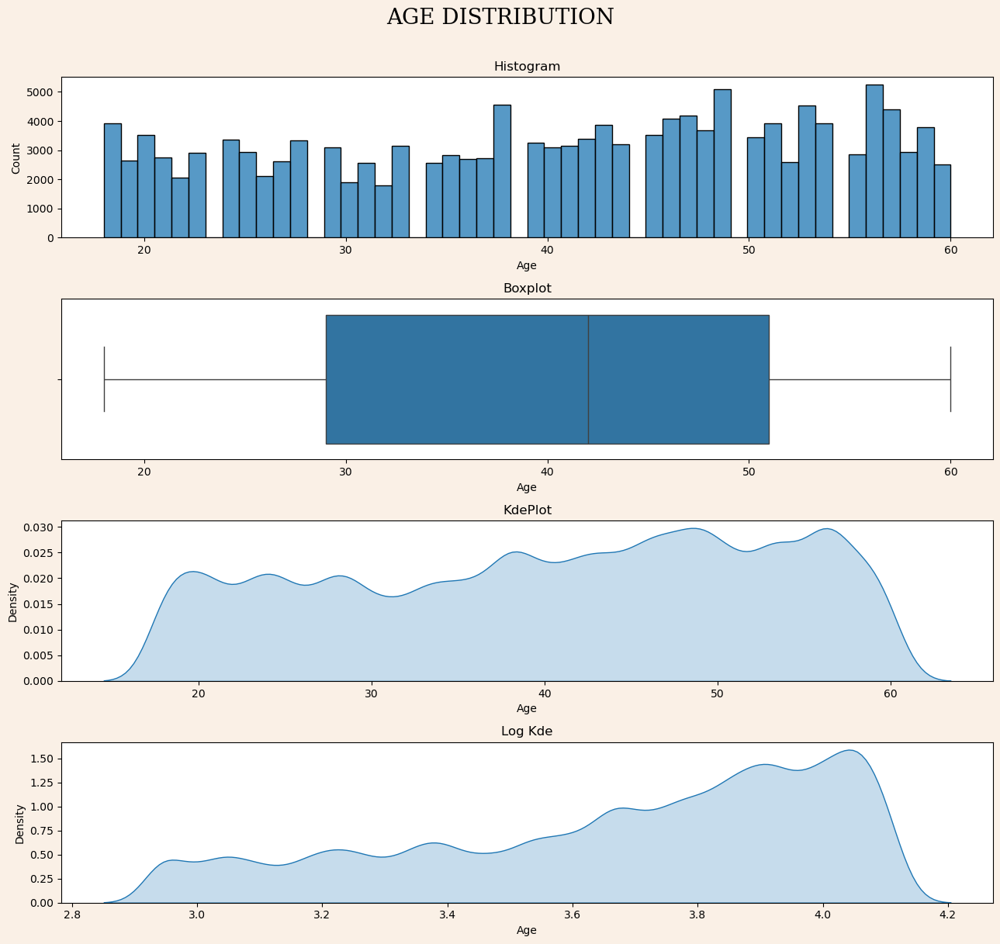

In [35]:
# Distribution
def plot_numeric(feature):
    fig,ax = plt.subplots(4,1,figsize=(13,12),facecolor='linen')
    fig.suptitle(f'{feature.upper()} DISTRIBUTION',y=1.01,fontdict={'fontfamily':'serif'},size=20)
    ax[0].set_title('Histogram')
    sns.histplot(x=df[feature],ax=ax[0])
    ax[1].set_title('Boxplot')
    sns.boxplot(x=df[feature],ax=ax[1])
    ax[2].set_title('KdePlot')
    sns.kdeplot(x=df[feature],ax=ax[2],fill=True)
    ax[3].set_title('Log Kde')
    sns.kdeplot(np.log1p(df[feature]),ax=ax[3],fill=True)
    plt.tight_layout()

plot_numeric('Age')

In [36]:
def plot_category(feature):
    fig, ax = plt.subplot(1,2,figsize=(10,5))
    sns.countplot(x=feature, data=df)
    plt.pie()


In [37]:
def count_pie(feature):
    fig = px.pie(df,names=feature,title='PIE Distribution',width=600,height=600,hole=.4)
    fig.update_layout(
    paper_bgcolor="lightblue",  # Background outside the plotting area
    plot_bgcolor="lightyellow"  # Background inside the plotting area
    )

# Show the figure
    fig.show()
    

count_pie('City')

In [38]:
count_pie('Working Professional or Student')

In [39]:
count_pie('Profession')

In [40]:
count_pie('Academic Pressure')

In [41]:
count_pie('Academic Pressure')

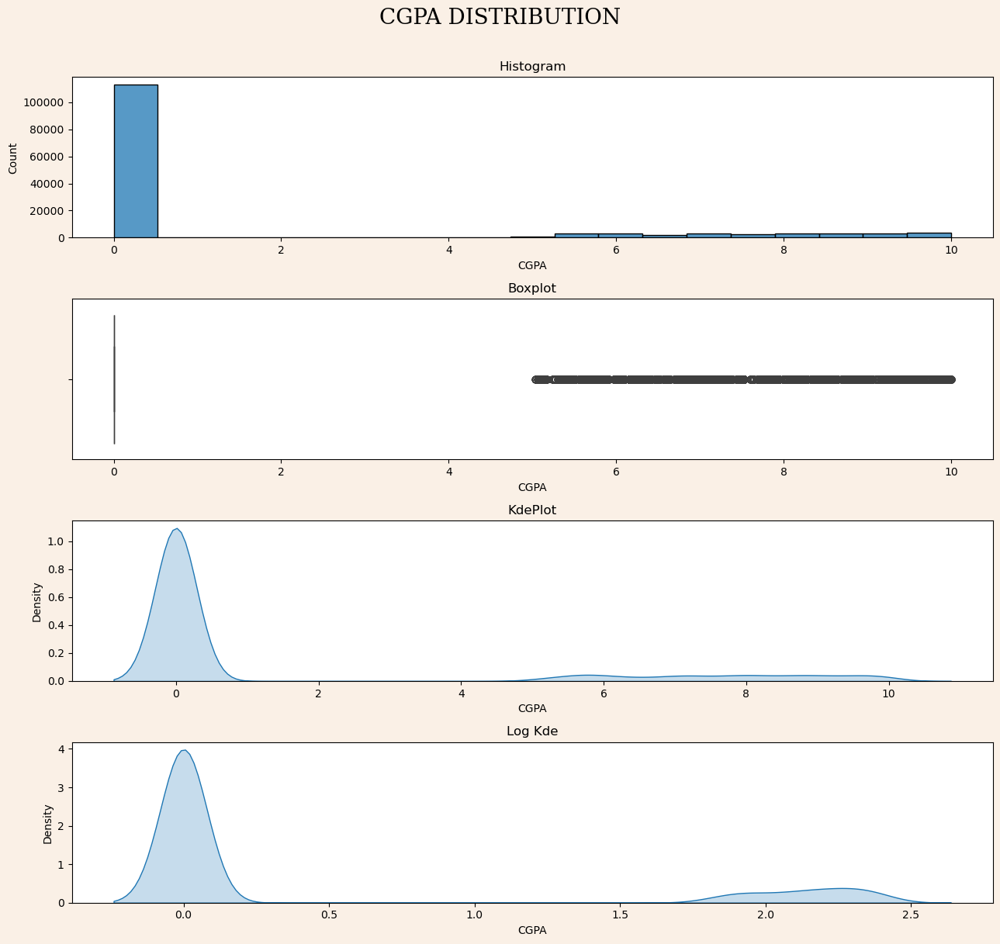

In [42]:
plot_numeric('CGPA')

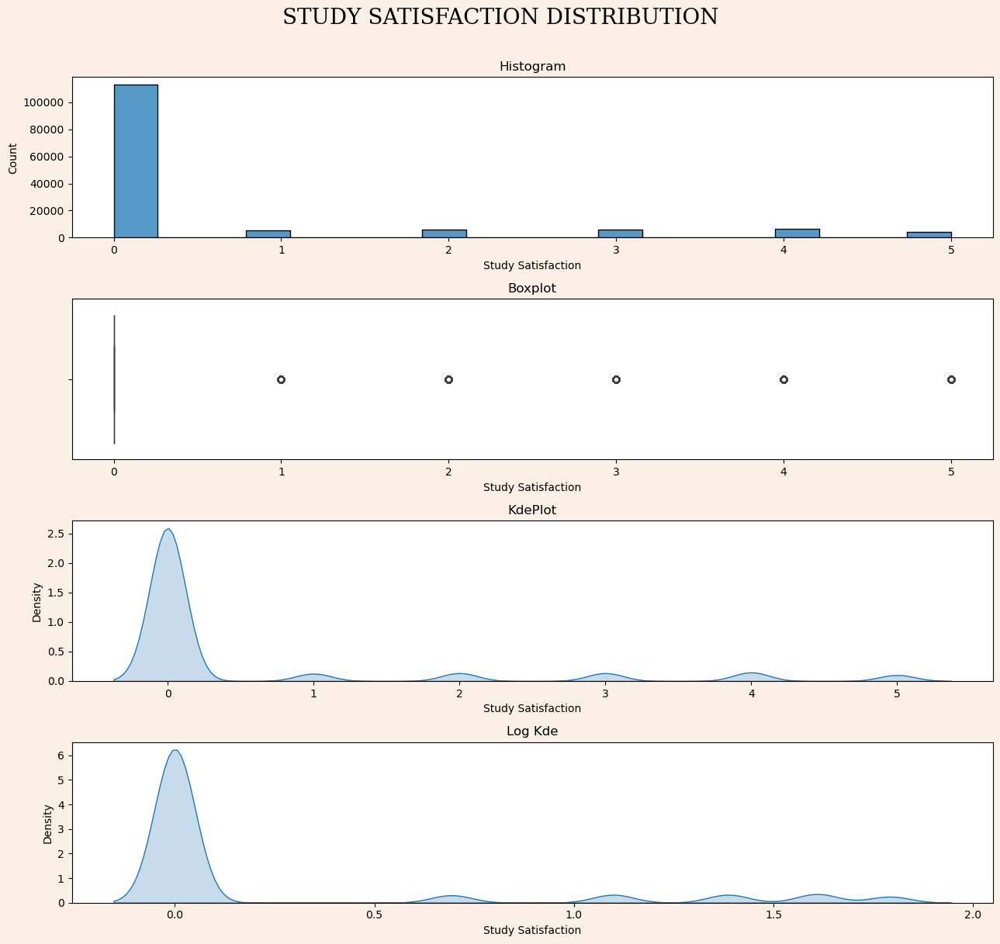

In [43]:
plot_numeric('Study Satisfaction')

In [44]:
count_pie('Job Satisfaction')

In [45]:
df['Sleep Duration'].unique()

array(['More than 8 hours', 'Less than 5 hours', '5-6 hours', '7-8 hours',
       'Sleep_Duration', '1-2 hours', '6-8 hours', '4-6 hours',
       '6-7 hours', '10-11 hours', '8-9 hours', '40-45 hours',
       '9-11 hours', '2-3 hours', '3-4 hours', 'Moderate', '55-66 hours',
       '4-5 hours', '9-6 hours', '1-3 hours', 'Indore', '45', '1-6 hours',
       '35-36 hours', '8 hours', 'No', '10-6 hours', 'than 5 hours',
       '49 hours', 'Unhealthy', 'Work_Study_Hours', '3-6 hours',
       '45-48 hours', '9-5', 'Pune', '9-5 hours'], dtype=object)

In [46]:
df['Sleep Duration'] = np.where(df['Sleep Duration'].str.contains('hours'),df['Sleep Duration'],np.NaN)

In [47]:
df.isnull().sum()

Gender                                 0
Age                                    0
City                                  90
Working Professional or Student        0
Profession                          8758
Academic Pressure                      0
Work Pressure                          0
CGPA                                   0
Study Satisfaction                     0
Job Satisfaction                       0
Sleep Duration                        15
Dietary Habits                         4
Degree                                 2
Suicidal_Thought                       0
Work/Study Hours                       0
Financial Stress                       4
Family History of Mental Illness       0
Depression                             0
dtype: int64

In [49]:
df['Dietary Habits'].unique()

array(['Healthy', 'Unhealthy', 'Moderate', 'Yes', 'Pratham', 'BSc',
       'Gender', '3', 'More Healthy', 'Less than Healthy', 'Mihir', '1.0',
       'Hormonal', 'Electrician', nan, 'No Healthy', 'Less Healthy',
       'M.Tech', 'Vegas', 'No', 'Male', 'Indoor', 'Class 12', '2'],
      dtype=object)

In [52]:
df['Dietary Habits'].value_counts()

Dietary Habits
Moderate             49703
Unhealthy            46224
Healthy              44739
Yes                      2
No                       2
More Healthy             2
No Healthy               1
Class 12                 1
Indoor                   1
Male                     1
Vegas                    1
M.Tech                   1
Less Healthy             1
1.0                      1
Electrician              1
Hormonal                 1
Mihir                    1
Less than Healthy        1
3                        1
Gender                   1
BSc                      1
Pratham                  1
2                        1
Name: count, dtype: int64

In [ ]:
df['Dietary Habits'].

0           Healthy
1         Unhealthy
2           Healthy
3          Moderate
4         Unhealthy
            ...    
140695    Unhealthy
140696     Moderate
140697     Moderate
140698     Moderate
140699      Healthy
Name: Dietary Habits, Length: 140693, dtype: object